Image shape: (2600, 3000, 3)
 latent shape: torch.Size([41, 47, 3, 64, 64])


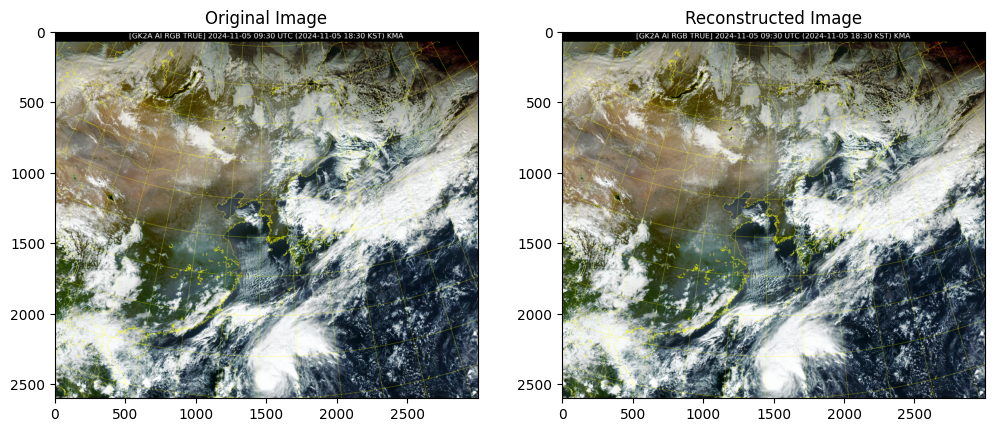

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch

# Define DCT and IDCT functions
def dct(x, norm=None):
    """
    Discrete Cosine Transform, Type II (DCT-II).
    :param x: the input signal
    :param norm: the normalization, None or 'ortho'
    :return: the DCT-II of the signal over the last dimension
    """
    x_shape = x.shape
    N = x_shape[-1]
    x = x.contiguous().view(-1, N)

    v = torch.cat([x[:, ::2], x[:, 1::2].flip([1])], dim=1)
    Vc = torch.view_as_real(torch.fft.fft(v, dim=1))

    k = - torch.arange(N, dtype=x.dtype, device=x.device)[None, :] * np.pi / (2 * N)
    W_r = torch.cos(k)
    W_i = torch.sin(k)

    V = Vc[:, :, 0] * W_r - Vc[:, :, 1] * W_i

    if norm == 'ortho':
        V[:, 0] /= np.sqrt(N) * 2
        V[:, 1:] /= np.sqrt(N / 2) * 2

    V = 2 * V.view(*x_shape)
    return V

def idct(X, norm=None):
    """
    Inverse Discrete Cosine Transform, Type III (IDCT).
    :param X: the input signal
    :param norm: the normalization, None or 'ortho'
    :return: the inverse DCT-II of the signal over the last dimension
    """
    x_shape = X.shape
    N = x_shape[-1]

    X_v = X.contiguous().view(-1, x_shape[-1]) / 2
    if norm == 'ortho':
        X_v[:, 0] *= np.sqrt(N) * 2
        X_v[:, 1:] *= np.sqrt(N / 2) * 2

    k = torch.arange(x_shape[-1], dtype=X.dtype, device=X.device)[None, :] * np.pi / (2 * N)
    W_r = torch.cos(k)
    W_i = torch.sin(k)

    V_t_r = X_v
    V_t_i = torch.cat([X_v[:, :1] * 0, -X_v.flip([1])[:, :-1]], dim=1)

    V_r = V_t_r * W_r - V_t_i * W_i
    V_i = V_t_r * W_i + V_t_i * W_r

    V = torch.cat([V_r.unsqueeze(2), V_i.unsqueeze(2)], dim=2)
    v = torch.fft.irfft(torch.view_as_complex(V), n=V.shape[1], dim=1)
    x = v.new_zeros(v.shape)
    x[:, ::2] += v[:, :N - (N // 2)]
    x[:, 1::2] += v.flip([1])[:, :N // 2]
    return x.view(*x_shape)

def dct_2d(x, norm=None):
    """
    2D Discrete Cosine Transform (DCT-II) using two 1D DCTs.
    :param x: the input tensor
    :param norm: the normalization, None or 'ortho'
    :return: the 2D DCT-II of the input
    """
    X1 = dct(x, norm=norm)
    X2 = dct(X1.transpose(-1, -2), norm=norm)
    return X2.transpose(-1, -2)

def idct_2d(X, norm=None):
    """
    Inverse 2D Discrete Cosine Transform (IDCT-II).
    :param X: the DCT-transformed tensor
    :param norm: the normalization, None or 'ortho'
    :return: the inverse 2D DCT-II, recovering the original data
    """
    x1 = idct(X, norm=norm)
    x2 = idct(x1.transpose(-1, -2), norm=norm)
    return x2.transpose(-1, -2)

# Define the DCTImageProcessor class
class DCTImageProcessor:
    def __init__(self, device="cpu"):
        self.device = torch.device(device)

    def load_image(self, path):
        image = Image.open(path).convert("RGB")
        return np.array(image)

    def pad_image(self, image, block_size=8):
        h, w, _ = image.shape
        pad_h = (block_size - h % block_size) % block_size
        pad_w = (block_size - w % block_size) % block_size
        padded_image = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
        return padded_image, (h, w)

    def torch_stdct(self, block):
        """Applies 2D DCT-II using provided dct_2d function."""
        return dct_2d(block, norm='ortho')

    def torch_istdct(self, dct_block):
        """Applies inverse 2D DCT-II using provided idct_2d function."""
        return idct_2d(dct_block, norm='ortho')

    def image_to_dct_with_overlap(self, image, block_size=8, hop_size=4):
        h, w, c = image.shape
        dct_height = (h - block_size) // hop_size + 1
        dct_width = (w - block_size) // hop_size + 1
        dct_latent = torch.zeros((dct_height, dct_width, c, block_size, block_size), dtype=torch.float32, device=self.device)

        image_tensor = torch.from_numpy(image).float().to(self.device)  # Move image to specified device
        for i in range(dct_height):
            for j in range(dct_width):
                for k in range(c):  # Iterate over channels
                    row_start = i * hop_size
                    col_start = j * hop_size
                    block = image_tensor[row_start:row_start + block_size, col_start:col_start + block_size, k]
                    dct_latent[i, j, k] = self.torch_stdct(block)

        return dct_latent

    def dct_to_image_with_overlap(self, dct_latent, original_size, block_size=8, hop_size=4):
        h, w = original_size
        padded_h = h + (block_size - h % block_size) % block_size
        padded_w = w + (block_size - w % block_size) % block_size
        reconstructed_image = torch.zeros((padded_h, padded_w, 3), dtype=torch.float32, device=self.device)
        weight_matrix = torch.zeros((padded_h, padded_w, 3), dtype=torch.float32, device=self.device)
        dct_height, dct_width, _, _, _ = dct_latent.shape

        for i in range(dct_height):
            for j in range(dct_width):
                for k in range(3):  # Iterate over channels
                    row_start = i * hop_size
                    col_start = j * hop_size
                    ifft_block = self.torch_istdct(dct_latent[i, j, k])
                    
                    # Add the block to the reconstructed image and update weights
                    reconstructed_image[row_start:row_start + block_size, col_start:col_start + block_size, k] += ifft_block
                    weight_matrix[row_start:row_start + block_size, col_start:col_start + block_size, k] += 1

        # Normalize by the weight matrix to account for overlapping areas
        reconstructed_image = torch.div(reconstructed_image, weight_matrix)
        return torch.clip(reconstructed_image[:h, :w, :], 0, 255).byte().cpu().numpy()

# Main pipeline
if __name__ == "__main__":
    filename = "gk2a_ami_le1b_rgb-s-true_ea020lc_202411050930.png"
    patch_size = 64
    hop_size = 64

    # Initialize processor on GPU
    processor = DCTImageProcessor(device="cuda")

    # Load and pad image
    image = processor.load_image(filename)
    padded_image, original_size = processor.pad_image(image, block_size=patch_size)
    print("Image shape:", image.shape)

    # Convert to DCT latent space
    
    dct_latent = processor.image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
    print(" latent shape:", dct_latent.shape)
    # Reconstruct the image from DCT latent space
    reconstructed_image = processor.dct_to_image_with_overlap(dct_latent, original_size, block_size=patch_size, hop_size=hop_size)

    # Visualize results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_image)
    plt.title("Reconstructed Image")

    plt.show()


Image loaded: (2600, 3000, 3) - Time: 0.6330 seconds
Image padded: (2624, 3008, 3) - Time: 0.0021 seconds
DCT latent shape: torch.Size([41, 47, 3, 64, 64]) - Time: 4.4190 seconds
Reconstructed image shape: (2600, 3000, 3) - Time: 7.5903 seconds


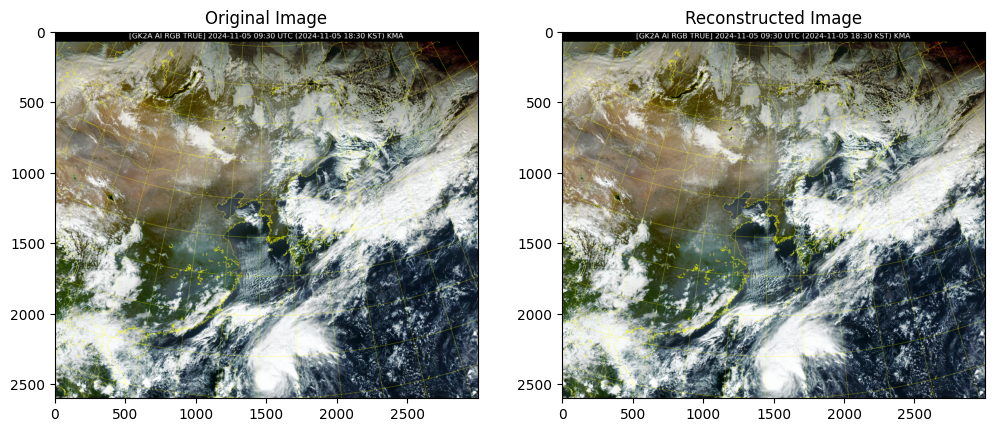

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import time

# Define DCT and IDCT functions
def dct(x, norm=None):
    x_shape = x.shape
    N = x_shape[-1]
    x = x.contiguous().view(-1, N)

    v = torch.cat([x[:, ::2], x[:, 1::2].flip([1])], dim=1)
    Vc = torch.view_as_real(torch.fft.fft(v, dim=1))

    k = - torch.arange(N, dtype=x.dtype, device=x.device)[None, :] * np.pi / (2 * N)
    W_r = torch.cos(k)
    W_i = torch.sin(k)

    V = Vc[:, :, 0] * W_r - Vc[:, :, 1] * W_i

    if norm == 'ortho':
        V[:, 0] /= np.sqrt(N) * 2
        V[:, 1:] /= np.sqrt(N / 2) * 2

    V = 2 * V.view(*x_shape)
    return V

def idct(X, norm=None):
    x_shape = X.shape
    N = x_shape[-1]

    X_v = X.contiguous().view(-1, x_shape[-1]) / 2
    if norm == 'ortho':
        X_v[:, 0] *= np.sqrt(N) * 2
        X_v[:, 1:] *= np.sqrt(N / 2) * 2

    k = torch.arange(x_shape[-1], dtype=X.dtype, device=X.device)[None, :] * np.pi / (2 * N)
    W_r = torch.cos(k)
    W_i = torch.sin(k)

    V_t_r = X_v
    V_t_i = torch.cat([X_v[:, :1] * 0, -X_v.flip([1])[:, :-1]], dim=1)

    V_r = V_t_r * W_r - V_t_i * W_i
    V_i = V_t_r * W_i + V_t_i * W_r

    V = torch.cat([V_r.unsqueeze(2), V_i.unsqueeze(2)], dim=2)
    v = torch.fft.irfft(torch.view_as_complex(V), n=V.shape[1], dim=1)
    x = v.new_zeros(v.shape)
    x[:, ::2] += v[:, :N - (N // 2)]
    x[:, 1::2] += v.flip([1])[:, :N // 2]
    return x.view(*x_shape)

def dct_2d(x, norm=None):
    X1 = dct(x, norm=norm)
    X2 = dct(X1.transpose(-1, -2), norm=norm)
    return X2.transpose(-1, -2)

def idct_2d(X, norm=None):
    x1 = idct(X, norm=norm)
    x2 = idct(x1.transpose(-1, -2), norm=norm)
    return x2.transpose(-1, -2)

# Define the DCTImageProcessor class
class DCTImageProcessor:
    def __init__(self, device="cpu"):
        self.device = torch.device(device)

    def load_image(self, path):
        image = Image.open(path).convert("RGB")
        return np.array(image)

    def pad_image(self, image, block_size=8):
        h, w, _ = image.shape
        pad_h = (block_size - h % block_size) % block_size
        pad_w = (block_size - w % block_size) % block_size
        padded_image = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
        return padded_image, (h, w)

    def torch_stdct(self, block):
        return dct_2d(block, norm='ortho')

    def torch_istdct(self, dct_block):
        return idct_2d(dct_block, norm='ortho')

    def image_to_dct_with_overlap(self, image, block_size=8, hop_size=4):
        h, w, c = image.shape
        dct_height = (h - block_size) // hop_size + 1
        dct_width = (w - block_size) // hop_size + 1
        dct_latent = torch.zeros((dct_height, dct_width, c, block_size, block_size), dtype=torch.float32, device=self.device)

        image_tensor = torch.from_numpy(image).float().to(self.device)
        for i in range(dct_height):
            for j in range(dct_width):
                for k in range(c):
                    row_start = i * hop_size
                    col_start = j * hop_size
                    block = image_tensor[row_start:row_start + block_size, col_start:col_start + block_size, k]
                    dct_latent[i, j, k] = self.torch_stdct(block)

        return dct_latent

    def dct_to_image_with_overlap(self, dct_latent, original_size, block_size=8, hop_size=4):
        h, w = original_size
        padded_h = h + (block_size - h % block_size) % block_size
        padded_w = w + (block_size - w % block_size) % block_size
        reconstructed_image = torch.zeros((padded_h, padded_w, 3), dtype=torch.float32, device=self.device)
        weight_matrix = torch.zeros((padded_h, padded_w, 3), dtype=torch.float32, device=self.device)
        dct_height, dct_width, _, _, _ = dct_latent.shape

        for i in range(dct_height):
            for j in range(dct_width):
                for k in range(3):
                    row_start = i * hop_size
                    col_start = j * hop_size
                    ifft_block = self.torch_istdct(dct_latent[i, j, k])
                    
                    reconstructed_image[row_start:row_start + block_size, col_start:col_start + block_size, k] += ifft_block
                    weight_matrix[row_start:row_start + block_size, col_start:col_start + block_size, k] += 1

        reconstructed_image = torch.div(reconstructed_image, weight_matrix)
        return torch.clip(reconstructed_image[:h, :w, :], 0, 255).byte().cpu().numpy()

# Main pipeline
if __name__ == "__main__":
    filename = "gk2a_ami_le1b_rgb-s-true_ea020lc_202411050930.png"
    patch_size = 64
    hop_size = 64

    processor = DCTImageProcessor(device="cuda")

    start_time = time.time()
    image = processor.load_image(filename)
    print("Image loaded:", image.shape, f"- Time: {time.time() - start_time:.4f} seconds")

    start_time = time.time()
    padded_image, original_size = processor.pad_image(image, block_size=patch_size)
    print("Image padded:", padded_image.shape, f"- Time: {time.time() - start_time:.4f} seconds")

    start_time = time.time()
    dct_latent = processor.image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
    print("DCT latent shape:", dct_latent.shape, f"- Time: {time.time() - start_time:.4f} seconds")

    start_time = time.time()
    reconstructed_image = processor.dct_to_image_with_overlap(dct_latent, original_size, block_size=patch_size, hop_size=hop_size)
    print("Reconstructed image shape:", reconstructed_image.shape, f"- Time: {time.time() - start_time:.4f} seconds")

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_image)
    plt.title("Reconstructed Image")

    plt.show()


Image loaded: torch.Size([3, 683, 1024]) - Time: 0.0364 seconds
Image padded: torch.Size([3, 688, 1024]) - Time: 0.0012 seconds
DCT latent shape: torch.Size([3, 171, 255, 8, 8]) - Time: 2.9343 seconds


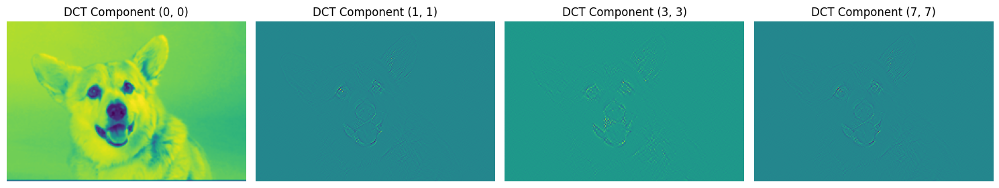

Reconstructed image shape: torch.Size([3, 683, 1024]) - Time: 0.1440 seconds


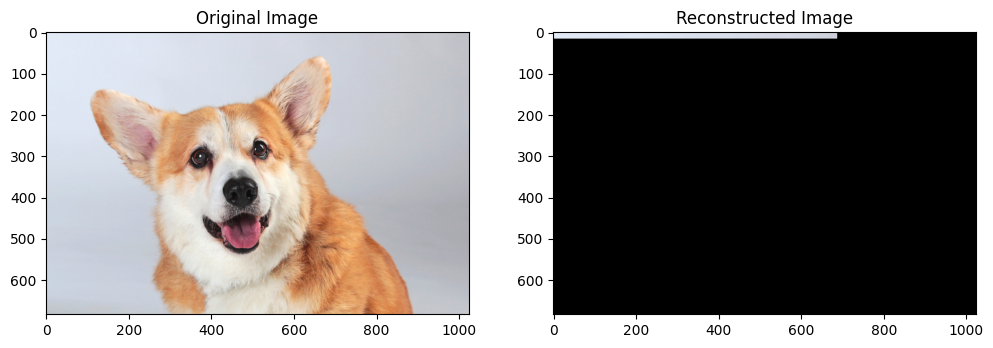

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
import time
from PIL import Image

# Use torch's built-in DCT and FFT functions if available (try torch.fft.fft2 for optimization)
def dct_2d(x):
    return torch.fft.fft2(x, norm='ortho').real  # If using FFT2 for speed, may need further tweaks

def idct_2d(X):
    return torch.fft.ifft2(X, norm='ortho').real  # Inverse with fft2's inverse for speed

class DCTImageProcessor:
    def __init__(self, device="cuda"):
        self.device = torch.device(device)

    def load_image(self, path):
        image = Image.open(path).convert("RGB")
        transform = T.ToTensor()
        image_tensor = transform(image).to(self.device)
        return image_tensor

    def pad_image(self, image, block_size=8):
        _, h, w = image.shape
        pad_h = (block_size - h % block_size) % block_size
        pad_w = (block_size - w % block_size) % block_size
        padded_image = torch.nn.functional.pad(image, (0, pad_w, 0, pad_h), mode="constant", value=0)
        return padded_image, (h, w)

    def image_to_dct_with_overlap(self, image, block_size=8, hop_size=4):
        _, h, w = image.shape
        dct_height = (h - block_size) // hop_size + 1
        dct_width = (w - block_size) // hop_size + 1
        dct_latent = torch.zeros((3, dct_height, dct_width, block_size, block_size), device=self.device)

        for i in range(dct_height):
            for j in range(dct_width):
                row_start, col_start = i * hop_size, j * hop_size
                block = image[:, row_start:row_start + block_size, col_start:col_start + block_size]
                dct_latent[:, i, j] = dct_2d(block)
        
        return dct_latent

    def dct_to_image_with_overlap(self, dct_latent, original_size, block_size=8, hop_size=4):
        h, w = original_size  # Unpack only height and width
        padded_h = h + (block_size - h % block_size) % block_size
        padded_w = w + (block_size - w % block_size) % block_size
        reconstructed_image = torch.zeros((3, padded_h, padded_w), dtype=torch.float32, device=self.device)
        weight_matrix = torch.zeros((3, padded_h, padded_w), dtype=torch.float32, device=self.device)
        dct_height, dct_width, _, _, _ = dct_latent.shape
    
        for i in range(dct_height):
            for j in range(dct_width):
                for k in range(3):
                    row_start, col_start = i * hop_size, j * hop_size
                    ifft_block = idct_2d(dct_latent[k, i, j])
                    
                    reconstructed_image[k, row_start:row_start + block_size, col_start:col_start + block_size] += ifft_block
                    weight_matrix[k, row_start:row_start + block_size, col_start:col_start + block_size] += 1
    
        reconstructed_image = torch.div(reconstructed_image, weight_matrix)
        return torch.clamp(reconstructed_image[:, :h, :w] * 255, 0, 255).byte()

import matplotlib.pyplot as plt

def show_dct_latent_components(dct_latent):
    positions = [(0, 0), (1, 1), (3, 3), (7, 7) ]
    fig, axes = plt.subplots(1, len(positions), figsize=(15, 3))

    for idx, (i, j) in enumerate(positions):
        # Select the specified DCT component in the first channel (channel 0)
        component = dct_latent[0, :, :, i, j].cpu().numpy()  # Use `cpu()` if on GPU

        # Plot the component
        axes[idx].imshow(component, cmap="viridis")
        axes[idx].set_title(f"DCT Component ({i}, {j})")
        axes[idx].axis("off")

    plt.tight_layout()
    plt.show()


# Main pipeline
#if __name__ == "__main__":
filename = "dog.png"
patch_size = 8
hop_size = 4

processor = DCTImageProcessor(device="cuda")

torch.cuda.synchronize()
start_time = time.time()
image = processor.load_image(filename)
torch.cuda.synchronize()
print("Image loaded:", image.shape, f"- Time: {time.time() - start_time:.4f} seconds")

torch.cuda.synchronize()
start_time = time.time()
padded_image, original_size = processor.pad_image(image, block_size=patch_size)
torch.cuda.synchronize()
print("Image padded:", padded_image.shape, f"- Time: {time.time() - start_time:.4f} seconds")

torch.cuda.synchronize()
start_time = time.time()
dct_latent = processor.image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
torch.cuda.synchronize()
print("DCT latent shape:", dct_latent.shape, f"- Time: {time.time() - start_time:.4f} seconds")

# Call the function to show DCT components
show_dct_latent_components(dct_latent)



torch.cuda.synchronize()
start_time = time.time()
reconstructed_image = processor.dct_to_image_with_overlap(dct_latent, original_size, block_size=patch_size, hop_size=hop_size)
torch.cuda.synchronize()
print("Reconstructed image shape:", reconstructed_image.shape, f"- Time: {time.time() - start_time:.4f} seconds")

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image.cpu().permute(1, 2, 0).numpy())
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image.cpu().permute(1, 2, 0).numpy())
plt.title("Reconstructed Image")

plt.show()


In [2]:
dct_latent.shape

torch.Size([3, 325, 375, 16, 16])

Image shape: torch.Size([3, 683, 1024])
DCT latent shape: torch.Size([3, 21, 31, 64, 64])
Reconstructed image shape: torch.Size([3, 683, 1024])


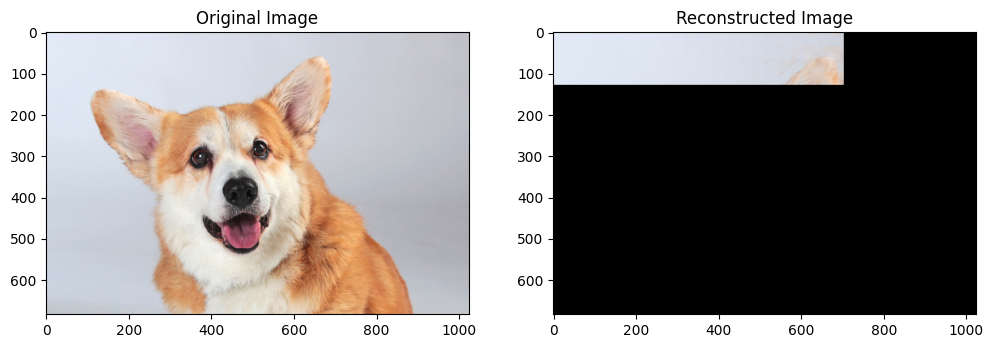

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
import time
from PIL import Image

# DCT and IDCT functions using torch.fft for better GPU performance
def dct_2d(x):
    return torch.fft.fft2(x, norm='ortho').real

def idct_2d(X):
    return torch.fft.ifft2(X, norm='ortho').real

class DCTImageProcessor:
    def __init__(self, device="cuda"):
        self.device = torch.device(device)

    def load_image(self, path):
        image = Image.open(path).convert("RGB")
        transform = T.ToTensor()
        image_tensor = transform(image).to(self.device)
        return image_tensor

    def pad_image(self, image, block_size=8):
        _, h, w = image.shape
        pad_h = (block_size - h % block_size) % block_size
        pad_w = (block_size - w % block_size) % block_size
        padded_image = torch.nn.functional.pad(image, (0, pad_w, 0, pad_h), mode="constant", value=0)
        return padded_image, (h, w)

    def image_to_dct_with_overlap(self, image, block_size=8, hop_size=4):
        _, h, w = image.shape
        dct_height = (h - block_size) // hop_size + 1
        dct_width = (w - block_size) // hop_size + 1
        dct_latent = torch.zeros((3, dct_height, dct_width, block_size, block_size), device=self.device)

        for i in range(dct_height):
            for j in range(dct_width):
                row_start, col_start = i * hop_size, j * hop_size
                block = image[:, row_start:row_start + block_size, col_start:col_start + block_size]
                dct_latent[:, i, j] = dct_2d(block)
        
        return dct_latent

    def dct_to_image_with_overlap(self, dct_latent, original_size, block_size=8, hop_size=4):
        h, w = original_size
        padded_h = h + (block_size - h % block_size) % block_size
        padded_w = w + (block_size - w % block_size) % block_size
        reconstructed_image = torch.zeros((3, padded_h, padded_w), device=self.device)
        weight_matrix = torch.zeros((3, padded_h, padded_w), device=self.device)
        dct_height, dct_width, _, _, _ = dct_latent.shape

        # Iterate over blocks and apply IDCT to reconstruct the image with overlapping regions
        for i in range(dct_height):
            for j in range(dct_width):
                row_start, col_start = i * hop_size, j * hop_size
                for k in range(3):  # Iterate over each color channel
                    ifft_block = idct_2d(dct_latent[k, i, j])

                    # Add the block to the reconstructed image
                    reconstructed_image[k, row_start:row_start + block_size, col_start:col_start + block_size] += ifft_block
                    weight_matrix[k, row_start:row_start + block_size, col_start:col_start + block_size] += 1

        # Normalize by the weight matrix to account for overlapping areas
        reconstructed_image = torch.div(reconstructed_image, weight_matrix)
        return torch.clamp(reconstructed_image[:, :h, :w] * 255, 0, 255).byte()

# Main pipeline
if __name__ == "__main__":
    filename = "dog.png"
    patch_size = 64
    hop_size = 32  # Change hop_size to ensure overlap

    processor = DCTImageProcessor(device="cuda")

    # Load and pad image
    image = processor.load_image(filename)
    padded_image, original_size = processor.pad_image(image, block_size=patch_size)
    print("Image shape:", image.shape)

    # Convert to DCT latent space
    dct_latent = processor.image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
    print("DCT latent shape:", dct_latent.shape)

    # Reconstruct the image from DCT latent space
    reconstructed_image = processor.dct_to_image_with_overlap(dct_latent, original_size, block_size=patch_size, hop_size=hop_size)
    print("Reconstructed image shape:", reconstructed_image.shape)

    # Visualize results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image.cpu().permute(1, 2, 0).numpy())
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_image.cpu().permute(1, 2, 0).numpy())
    plt.title("Reconstructed Image")

    plt.show()


In [11]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
from PIL import Image
import time

import torch

import torch

def create_dct_matrix(N, device="cpu"):
    """Creates a DCT type-II transform matrix using only PyTorch."""
    dct_mat = torch.zeros((N, N), dtype=torch.float32, device=device)
    for k in range(N):
        for n in range(N):
            if k == 0:
                dct_mat[k, n] = 1 / torch.sqrt(torch.tensor(N, dtype=torch.float32, device=device))
            else:
                angle = torch.tensor((torch.pi * (2 * n + 1) * k) / (2 * N), device=device, dtype=torch.float32)
                dct_mat[k, n] = torch.sqrt(torch.tensor(2 / N, dtype=torch.float32, device=device)) * torch.cos(angle)
    return dct_mat

def dct_2d(x):
    """Applies 2D DCT-II using matrix multiplication with the generated DCT matrix."""
    N, M = x.shape[-2], x.shape[-1]
    dct_mat_N = create_dct_matrix(N, device=x.device)
    dct_mat_M = create_dct_matrix(M, device=x.device)
    return dct_mat_N @ x @ dct_mat_M.T

def idct_2d(X):
    """Applies 2D IDCT-II using matrix multiplication with the generated DCT matrix transpose."""
    N, M = X.shape[-2], X.shape[-1]
    idct_mat_N = create_dct_matrix(N, device=X.device).T
    idct_mat_M = create_dct_matrix(M, device=X.device).T
    return idct_mat_N @ X @ idct_mat_M.T



class DCTImageProcessor:
    def __init__(self, device="cuda"):
        self.device = torch.device(device)

    def load_image(self, path):
        image = Image.open(path).convert("RGB")
        transform = T.ToTensor()
        image_tensor = transform(image).to(self.device)
        return image_tensor

    def pad_image(self, image, block_size=8):
        _, h, w = image.shape
        pad_h = (block_size - h % block_size) % block_size
        pad_w = (block_size - w % block_size) % block_size
        padded_image = torch.nn.functional.pad(image, (0, pad_w, 0, pad_h), mode="constant", value=0)
        return padded_image, (h, w)

    def image_to_dct_with_overlap(self, image, block_size=8, hop_size=4):
        _, h, w = image.shape
        dct_height = (h - block_size) // hop_size + 1
        dct_width = (w - block_size) // hop_size + 1
        dct_latent = torch.zeros((3, dct_height, dct_width, block_size, block_size), device=self.device)

        for i in range(dct_height):
            for j in range(dct_width):
                row_start, col_start = i * hop_size, j * hop_size
                block = image[:, row_start:row_start + block_size, col_start:col_start + block_size]
                dct_latent[:, i, j] = dct_2d(block)
        
        return dct_latent

    def dct_to_image_with_overlap(self, dct_latent, original_size, block_size=8, hop_size=4):
        h, w = original_size
        padded_h = h + (block_size - h % block_size) % block_size
        padded_w = w + (block_size - w % block_size) % block_size
        reconstructed_image = torch.zeros((3, padded_h, padded_w), device=self.device)
        weight_matrix = torch.zeros((3, padded_h, padded_w), device=self.device)
        dct_height, dct_width, _, _, _ = dct_latent.shape

        # Iterate over blocks and apply IDCT to reconstruct the image with overlapping regions
        for i in range(dct_height):
            for j in range(dct_width):
                row_start, col_start = i * hop_size, j * hop_size
                for k in range(3):  # Iterate over each color channel
                    ifft_block = idct_2d(dct_latent[k, i, j])

                    # Add the block to the reconstructed image
                    reconstructed_image[k, row_start:row_start + block_size, col_start:col_start + block_size] += ifft_block
                    weight_matrix[k, row_start:row_start + block_size, col_start:col_start + block_size] += 1

        # Normalize by the weight matrix to account for overlapping areas
        reconstructed_image = torch.div(reconstructed_image, weight_matrix)
        return torch.clamp(reconstructed_image[:, :h, :w] * 255, 0, 255).byte()

# Main pipeline
if __name__ == "__main__":
    filename = "dog.png"
    patch_size = 64
    hop_size = 32  # Use an overlap of 50%

    processor = DCTImageProcessor(device="cuda")

    # Load and pad image
    image = processor.load_image(filename)
    padded_image, original_size = processor.pad_image(image, block_size=patch_size)
    print("Image shape:", image.shape)

    # Convert to DCT latent space
    dct_latent = processor.image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
    print("DCT latent shape:", dct_latent.shape)

    # Reconstruct the image from DCT latent space
    reconstructed_image = processor.dct_to_image_with_overlap(dct_latent, original_size, block_size=patch_size, hop_size=hop_size)
    print("Reconstructed image shape:", reconstructed_image.shape)

    # Visualize results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image.cpu().permute(1, 2, 0).numpy())
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_image.cpu().permute(1, 2, 0).numpy())
    plt.title("Reconstructed Image")

    plt.show()


Image shape: torch.Size([3, 683, 1024])


KeyboardInterrupt: 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
from PIL import Image
import time
import torch.nn.functional as F
from scipy.fftpack import dct, idct
from scipy.signal.windows import get_window

class STDCT2D(torch.nn.Module):
    def __init__(self, filter_size=8, hop_size=4, window_type='hann', DEBUG=False):
        super(STDCT2D, self).__init__()
        self.filter_size = filter_size
        self.hop_size = hop_size
        self.window_type = window_type
        self.DEBUG = DEBUG

        # Create 2D DCT and inverse DCT bases
        dct_basis = dct(dct(np.eye(self.filter_size), type=2, norm='ortho').T, type=2, norm='ortho').T
        idct_basis = idct(idct(np.eye(self.filter_size), type=2, norm='ortho').T, type=2, norm='ortho').T

        forward_basis = torch.FloatTensor(dct_basis).unsqueeze(0).unsqueeze(0)  # For 2D conv
        inverse_basis = torch.FloatTensor(idct_basis).unsqueeze(0).unsqueeze(0)  # For 2D conv transpose

        # Window function
        fft_window = torch.from_numpy(get_window(window_type, self.filter_size, fftbins=True)).float()
        forward_basis *= fft_window[:, None] * fft_window[None, :]
        inverse_basis *= fft_window[:, None] * fft_window[None, :]

        # Register the buffers only if they haven't been registered yet
        if 'forward_basis' not in self._buffers:
            self.register_buffer('forward_basis', forward_basis)
        else:
            self.forward_basis.copy_(forward_basis)
        
        if 'inverse_basis' not in self._buffers:
            self.register_buffer('inverse_basis', inverse_basis)
        else:
            self.inverse_basis.copy_(inverse_basis)

    def transform(self, input_data):
        input_data = F.pad(input_data, (self.hop_size // 2, self.hop_size // 2,
                                        self.hop_size // 2, self.hop_size // 2), mode="reflect")
        # Set groups to 1 to apply the same DCT basis across all channels
        forward_transform = F.conv2d(input_data, self.forward_basis, stride=self.hop_size, padding=0, groups=1)
        return forward_transform

    def inverse(self, dct_coeffs):
        reconstructed_data = F.conv_transpose2d(dct_coeffs, self.inverse_basis, stride=self.hop_size, padding=0, groups=1)
        return reconstructed_data


class DCTImageProcessor:
    def __init__(self, device="cuda", filter_size=64, hop_size=32):
        self.device = torch.device(device)
        self.dct2d = STDCT2D(filter_size=filter_size, hop_size=hop_size).to(self.device)

    def load_image(self, path):
        image = Image.open(path).convert("RGB")
        transform = T.ToTensor()
        image_tensor = transform(image).to(self.device)
        return image_tensor

    def pad_image(self, image, block_size=8):
        _, h, w = image.shape
        pad_h = (block_size - h % block_size) % block_size
        pad_w = (block_size - w % block_size) % block_size
        padded_image = torch.nn.functional.pad(image, (0, pad_w, 0, pad_h), mode="constant", value=0)
        return padded_image, (h, w)

    def image_to_dct_with_overlap(self, image, block_size=64, hop_size=32):
        _, h, w = image.shape
        dct_height = (h - block_size) // hop_size + 1
        dct_width = (w - block_size) // hop_size + 1
        dct_latent = torch.zeros((3, dct_height, dct_width, block_size, block_size), device=self.device)

        for c in range(3):  # Iterate over channels
            channel_dct = self.dct2d.transform(image[c:c+1])  # Apply DCT per channel
            dct_latent[c] = channel_dct

        return dct_latent

    def dct_to_image_with_overlap(self, dct_latent, original_size, block_size=64, hop_size=32):
        h, w = original_size
        padded_h = h + (block_size - h % block_size) % block_size
        padded_w = w + (block_size - w % block_size) % block_size
        reconstructed_image = torch.zeros((3, padded_h, padded_w), device=self.device)
        weight_matrix = torch.zeros((3, padded_h, padded_w), device=self.device)
        dct_height, dct_width, _, _, _ = dct_latent.shape

        for c in range(3):  # Iterate over each color channel
            channel_recon = self.dct2d.inverse(dct_latent[c:c+1])  # Apply inverse DCT per channel
            reconstructed_image[c] += channel_recon[0]
            weight_matrix[c] += 1

        # Normalize by the weight matrix to account for overlapping areas
        reconstructed_image = torch.div(reconstructed_image, weight_matrix)
        return torch.clamp(reconstructed_image[:, :h, :w] * 255, 0, 255).byte()

# Main pipeline
if __name__ == "__main__":
    filename = "dog.png"
    patch_size = 64
    hop_size = 32  # Use an overlap of 50%

    processor = DCTImageProcessor(device="cuda", filter_size=patch_size, hop_size=hop_size)

    # Load and pad image
    image = processor.load_image(filename)
    padded_image, original_size = processor.pad_image(image, block_size=patch_size)
    print("Image shape:", image.shape)

    # Convert to DCT latent space
    dct_latent = processor.image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
    print("DCT latent shape:", dct_latent.shape)

    # Reconstruct the image from DCT latent space
    reconstructed_image = processor.dct_to_image_with_overlap(dct_latent, original_size, block_size=patch_size, hop_size=hop_size)
    print("Reconstructed image shape:", reconstructed_image.shape)

    # Visualize results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image.cpu().permute(1, 2, 0).numpy())
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_image.cpu().permute(1, 2, 0).numpy())
    plt.title("Reconstructed Image")

    plt.show()


Image shape: torch.Size([3, 683, 1024])


RuntimeError: The expanded size of the tensor (64) must match the existing size (32) at non-singleton dimension 3.  Target sizes: [21, 31, 64, 64].  Tensor sizes: [22, 32]

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
from PIL import Image
import time
import torch.nn.functional as F
from scipy.fftpack import dct, idct
from scipy.signal.windows import get_window

class STDCT2D(torch.nn.Module):
    def __init__(self, filter_size=8, hop_size=4, window_type='hann', DEBUG=False):
        super(STDCT2D, self).__init__()
        self.filter_size = filter_size
        self.hop_size = hop_size
        self.window_type = window_type
        self.DEBUG = DEBUG

        # Create 2D DCT and inverse DCT bases
        dct_basis = dct(dct(np.eye(self.filter_size), type=2, norm='ortho').T, type=2, norm='ortho').T
        idct_basis = idct(idct(np.eye(self.filter_size), type=2, norm='ortho').T, type=2, norm='ortho').T

        forward_basis = torch.FloatTensor(dct_basis).unsqueeze(0).unsqueeze(0)  # For 2D conv
        inverse_basis = torch.FloatTensor(idct_basis).unsqueeze(0).unsqueeze(0)  # For 2D conv transpose

        # Window function
        fft_window = torch.from_numpy(get_window(window_type, self.filter_size, fftbins=True)).float()
        forward_basis *= fft_window[:, None] * fft_window[None, :]
        inverse_basis *= fft_window[:, None] * fft_window[None, :]

        if 'forward_basis' not in self._buffers:
            self.register_buffer('forward_basis', forward_basis)
        else:
            self.forward_basis.copy_(forward_basis)
        
        if 'inverse_basis' not in self._buffers:
            self.register_buffer('inverse_basis', inverse_basis)
        else:
            self.inverse_basis.copy_(inverse_basis)

    def transform(self, input_data):
        input_data = F.pad(input_data, (self.hop_size // 2, self.hop_size // 2,
                                        self.hop_size // 2, self.hop_size // 2), mode="reflect")
        forward_transform = F.conv2d(input_data, self.forward_basis, stride=self.hop_size, padding=0, groups=1)
        return forward_transform

    def inverse(self, dct_coeffs):
        reconstructed_data = F.conv_transpose2d(dct_coeffs, self.inverse_basis, stride=self.hop_size, padding=0, groups=1)
        return reconstructed_data

class DCTImageProcessor:
    def __init__(self, device="cuda", filter_size=64, hop_size=32):
        self.device = torch.device(device)
        self.dct2d = STDCT2D(filter_size=filter_size, hop_size=hop_size).to(self.device)

    def load_image(self, path):
        image = Image.open(path).convert("RGB")
        transform = T.ToTensor()
        image_tensor = transform(image).to(self.device)
        return image_tensor

    def pad_image(self, image, block_size=8):
        _, h, w = image.shape
        pad_h = (block_size - h % block_size) % block_size
        pad_w = (block_size - w % block_size) % block_size
        padded_image = F.pad(image, (0, pad_w, 0, pad_h), mode="constant", value=0)
        return padded_image, (h, w)

    def image_to_dct_with_overlap(self, image, block_size=64, hop_size=32):
        _, h, w = image.shape
        dct_height = (h - block_size) // hop_size + 1
        dct_width = (w - block_size) // hop_size + 1
        dct_latent = torch.zeros((3, dct_height, dct_width, block_size, block_size), device=self.device)

        # Iterate over channels
        for c in range(3):
            channel = image[c:c+1].unsqueeze(0)  # Add batch dimension for conv2d
            channel_dct = self.dct2d.transform(channel)  # Apply DCT per channel

            # Adjust the size to match dct_latent if needed
            if channel_dct.shape[-2:] != (dct_height, dct_width):
                channel_dct = channel_dct[:, :, :dct_height, :dct_width]
            
            dct_latent[c] = channel_dct.squeeze(0)  # Remove batch dimension

        return dct_latent

    def dct_to_image_with_overlap(self, dct_latent, original_size, block_size=64, hop_size=32):
        h, w = original_size
        padded_h = h + (block_size - h % block_size) % block_size
        padded_w = w + (block_size - w % block_size) % block_size
        reconstructed_image = torch.zeros((3, padded_h, padded_w), device=self.device)
        weight_matrix = torch.zeros((3, padded_h, padded_w), device=self.device)
        dct_height, dct_width, _, _, _ = dct_latent.shape

        # Iterate over blocks and apply IDCT to reconstruct the image with overlapping regions
        for c in range(3):  # Iterate over each color channel
            for i in range(dct_height):
                for j in range(dct_width):
                    row_start, col_start = i * hop_size, j * hop_size
                    ifft_block = self.dct2d.inverse(dct_latent[c:c+1, i, j])

                    # Resize block if necessary
                    if ifft_block.shape[-2:] != (block_size, block_size):
                        ifft_block = ifft_block[:, :, :block_size, :block_size]

                    reconstructed_image[c, row_start:row_start + block_size, col_start:col_start + block_size] += ifft_block.squeeze(0)
                    weight_matrix[c, row_start:row_start + block_size, col_start:col_start + block_size] += 1

        # Normalize by the weight matrix to account for overlapping areas
        reconstructed_image = torch.div(reconstructed_image, weight_matrix)
        return torch.clamp(reconstructed_image[:, :h, :w] * 255, 0, 255).byte()

# Main pipeline
if __name__ == "__main__":
    filename = "dog.png"
    patch_size = 64
    hop_size = 32  # Use an overlap of 50%

    processor = DCTImageProcessor(device="cuda", filter_size=patch_size, hop_size=hop_size)

    # Load and pad image
    image = processor.load_image(filename)
    padded_image, original_size = processor.pad_image(image, block_size=patch_size)
    print("Image shape:", image.shape)

    # Convert to DCT latent space
    dct_latent = processor.image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
    print("DCT latent shape:", dct_latent.shape)

    # Reconstruct the image from DCT latent space
    reconstructed_image = processor.dct_to_image_with_overlap(dct_latent, original_size, block_size=patch_size, hop_size=hop_size)
    print("Reconstructed image shape:", reconstructed_image.shape)

    # Visualize results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image.cpu().permute(1, 2, 0).numpy())
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_image.cpu().permute(1, 2, 0).numpy())
    plt.title("Reconstructed Image")

    plt.show()


Image shape: torch.Size([3, 683, 1024])


RuntimeError: The expanded size of the tensor (64) must match the existing size (31) at non-singleton dimension 3.  Target sizes: [21, 31, 64, 64].  Tensor sizes: [21, 31]

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
from PIL import Image
import torch.nn.functional as F
from scipy.fftpack import dct, idct
from scipy.signal.windows import get_window

class STDCT2D(torch.nn.Module):
    def __init__(self, filter_size=8, hop_size=4, window_type='hann', DEBUG=False):
        super(STDCT2D, self).__init__()
        self.filter_size = filter_size
        self.hop_size = hop_size
        self.window_type = window_type
        self.DEBUG = DEBUG

        # Create 2D DCT and inverse DCT bases
        dct_basis = dct(dct(np.eye(self.filter_size), type=2, norm='ortho').T, type=2, norm='ortho').T
        idct_basis = idct(idct(np.eye(self.filter_size), type=2, norm='ortho').T, type=2, norm='ortho').T

        forward_basis = torch.FloatTensor(dct_basis).unsqueeze(0).unsqueeze(0)  # For 2D conv
        inverse_basis = torch.FloatTensor(idct_basis).unsqueeze(0).unsqueeze(0)  # For 2D conv transpose

        # Window function
        fft_window = torch.from_numpy(get_window(window_type, self.filter_size, fftbins=True)).float()
        forward_basis *= fft_window[:, None] * fft_window[None, :]
        inverse_basis *= fft_window[:, None] * fft_window[None, :]

        if 'forward_basis' not in self._buffers:
            self.register_buffer('forward_basis', forward_basis)
        else:
            self.forward_basis.copy_(forward_basis)
        
        if 'inverse_basis' not in self._buffers:
            self.register_buffer('inverse_basis', inverse_basis)
        else:
            self.inverse_basis.copy_(inverse_basis)

    def transform(self, block):
        # Apply the 2D DCT transform
        block = F.pad(block, (self.hop_size // 2, self.hop_size // 2, self.hop_size // 2, self.hop_size // 2), mode="reflect")
        return F.conv2d(block, self.forward_basis, stride=self.hop_size, padding=0, groups=1)

    def inverse(self, dct_coeffs):
        # Apply the 2D inverse DCT
        return F.conv_transpose2d(dct_coeffs, self.inverse_basis, stride=self.hop_size, padding=0, groups=1)

class DCTImageProcessor:
    def __init__(self, device="cuda", filter_size=64, hop_size=32):
        self.device = torch.device(device)
        self.dct2d = STDCT2D(filter_size=filter_size, hop_size=hop_size).to(self.device)

    def load_image(self, path):
        image = Image.open(path).convert("RGB")
        transform = T.ToTensor()
        image_tensor = transform(image).to(self.device)
        return image_tensor

    def pad_image(self, image, block_size=8):
        _, h, w = image.shape
        pad_h = (block_size - h % block_size) % block_size
        pad_w = (block_size - w % block_size) % block_size
        padded_image = F.pad(image, (0, pad_w, 0, pad_h), mode="constant", value=0)
        return padded_image, (h, w)

    def image_to_dct_with_overlap(self, image, block_size=64, hop_size=32):
        _, h, w = image.shape
        dct_height = (h - block_size) // hop_size + 1
        dct_width = (w - block_size) // hop_size + 1
        dct_latent = torch.zeros((3, dct_height, dct_width, block_size, block_size), device=self.device)

        # Iterate over patches with overlap
        for c in range(3):
            for i in range(dct_height):
                for j in range(dct_width):
                    row_start, col_start = i * hop_size, j * hop_size
                    block = image[c:c+1, row_start:row_start + block_size, col_start:col_start + block_size]
                    dct_latent[c, i, j] = self.dct2d.transform(block.unsqueeze(0)).squeeze(0)

        return dct_latent

    def dct_to_image_with_overlap(self, dct_latent, original_size, block_size=64, hop_size=32):
        h, w = original_size
        padded_h = h + (block_size - h % block_size) % block_size
        padded_w = w + (block_size - w % block_size) % block_size
        reconstructed_image = torch.zeros((3, padded_h, padded_w), device=self.device)
        weight_matrix = torch.zeros((3, padded_h, padded_w), device=self.device)
        dct_height, dct_width, _, _, _ = dct_latent.shape

        # Iterate over patches for reconstruction
        for c in range(3):  # Each channel
            for i in range(dct_height):
                for j in range(dct_width):
                    row_start, col_start = i * hop_size, j * hop_size
                    block = dct_latent[c:c+1, i, j].unsqueeze(0)
                    ifft_block = self.dct2d.inverse(block).squeeze(0)

                    reconstructed_image[c, row_start:row_start + block_size, col_start:col_start + block_size] += ifft_block
                    weight_matrix[c, row_start:row_start + block_size, col_start:col_start + block_size] += 1

        # Normalize by the weight matrix
        reconstructed_image = torch.div(reconstructed_image, weight_matrix)
        return torch.clamp(reconstructed_image[:, :h, :w] * 255, 0, 255).byte()

# Main pipeline
if __name__ == "__main__":
    filename = "dog.png"
    patch_size = 64
    hop_size = 32  # 50% overlap

    processor = DCTImageProcessor(device="cuda", filter_size=patch_size, hop_size=hop_size)

    # Load and pad image
    image = processor.load_image(filename)
    padded_image, original_size = processor.pad_image(image, block_size=patch_size)
    print("Image shape:", image.shape)

    # Convert to DCT latent space
    dct_latent = processor.image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
    print("DCT latent shape:", dct_latent.shape)

    # Reconstruct the image from DCT latent space
    reconstructed_image = processor.dct_to_image_with_overlap(dct_latent, original_size, block_size=patch_size, hop_size=hop_size)
    print("Reconstructed image shape:", reconstructed_image.shape)

    # Visualize results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image.cpu().permute(1, 2, 0).numpy())
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_image.cpu().permute(1, 2, 0).numpy())
    plt.title("Reconstructed Image")

    plt.show()


Image shape: torch.Size([3, 683, 1024])


RuntimeError: The expanded size of the tensor (64) must match the existing size (2) at non-singleton dimension 1.  Target sizes: [64, 64].  Tensor sizes: [2, 2]

Image shape: torch.Size([3, 683, 1024])
DCT latent shape: torch.Size([3, 21, 31, 64, 64])
Reconstructed image shape: torch.Size([3, 683, 1024])


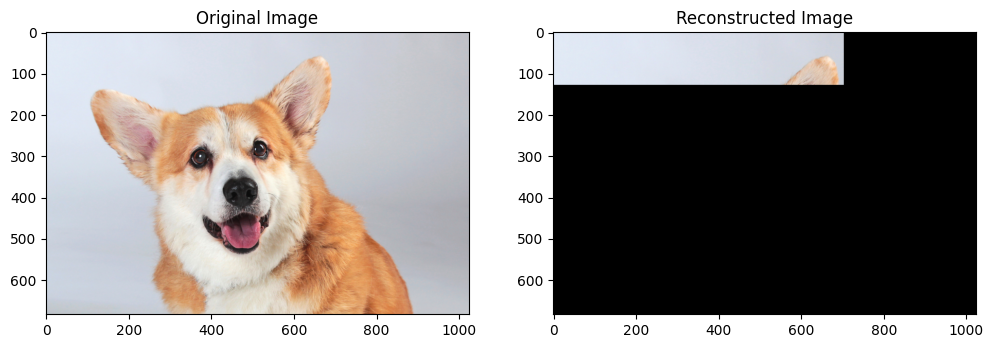

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
from PIL import Image
import torch.nn.functional as F
from scipy.fftpack import dct, idct

# Define simple DCT and IDCT functions using PyTorch matrix multiplication
def dct_2d(block):
    """Applies 2D DCT using the DCT-II type directly."""
    return dct(dct(block, axis=0, norm='ortho'), axis=1, norm='ortho')

def idct_2d(dct_block):
    """Applies 2D IDCT using the DCT-III type to reconstruct."""
    return idct(idct(dct_block, axis=0, norm='ortho'), axis=1, norm='ortho')

class DCTImageProcessor:
    def __init__(self, device="cuda"):
        self.device = torch.device(device)

    def load_image(self, path):
        image = Image.open(path).convert("RGB")
        transform = T.ToTensor()
        image_tensor = transform(image).to(self.device)
        return image_tensor

    def pad_image(self, image, block_size=8):
        _, h, w = image.shape
        pad_h = (block_size - h % block_size) % block_size
        pad_w = (block_size - w % block_size) % block_size
        padded_image = F.pad(image, (0, pad_w, 0, pad_h), mode="constant", value=0)
        return padded_image, (h, w)

    def image_to_dct_with_overlap(self, image, block_size=8, hop_size=4):
        _, h, w = image.shape
        dct_height = (h - block_size) // hop_size + 1
        dct_width = (w - block_size) // hop_size + 1
        dct_latent = torch.zeros((3, dct_height, dct_width, block_size, block_size), device=self.device)

        # Iterate over each block
        for c in range(3):  # Each color channel
            for i in range(dct_height):
                for j in range(dct_width):
                    row_start, col_start = i * hop_size, j * hop_size
                    block = image[c, row_start:row_start + block_size, col_start:col_start + block_size].cpu().numpy()
                    dct_latent[c, i, j] = torch.tensor(dct_2d(block), device=self.device)

        return dct_latent

    def dct_to_image_with_overlap(self, dct_latent, original_size, block_size=8, hop_size=4):
        h, w = original_size
        padded_h = h + (block_size - h % block_size) % block_size
        padded_w = w + (block_size - w % block_size) % block_size
        reconstructed_image = torch.zeros((3, padded_h, padded_w), device=self.device)
        weight_matrix = torch.zeros((3, padded_h, padded_w), device=self.device)
        dct_height, dct_width, _, _, _ = dct_latent.shape

        # Iterate over each DCT block and reconstruct
        for c in range(3):  # Each channel
            for i in range(dct_height):
                for j in range(dct_width):
                    row_start, col_start = i * hop_size, j * hop_size
                    dct_block = dct_latent[c, i, j].cpu().numpy()
                    ifft_block = idct_2d(dct_block)
                    ifft_block_tensor = torch.tensor(ifft_block, device=self.device)

                    # Add reconstructed block to the final image with overlap handling
                    reconstructed_image[c, row_start:row_start + block_size, col_start:col_start + block_size] += ifft_block_tensor
                    weight_matrix[c, row_start:row_start + block_size, col_start:col_start + block_size] += 1

        # Normalize overlapping regions
        reconstructed_image = torch.div(reconstructed_image, weight_matrix)
        return torch.clamp(reconstructed_image[:, :h, :w] * 255, 0, 255).byte()

# Main pipeline
if __name__ == "__main__":
    filename = "dog.png"
    patch_size = 64
    hop_size = 32  # 50% overlap

    processor = DCTImageProcessor(device="cuda")

    # Load and pad image
    image = processor.load_image(filename)
    padded_image, original_size = processor.pad_image(image, block_size=patch_size)
    print("Image shape:", image.shape)

    # Convert to DCT latent space
    dct_latent = processor.image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
    print("DCT latent shape:", dct_latent.shape)

    # Reconstruct the image from DCT latent space
    reconstructed_image = processor.dct_to_image_with_overlap(dct_latent, original_size, block_size=patch_size, hop_size=hop_size)
    print("Reconstructed image shape:", reconstructed_image.shape)

    # Visualize results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image.cpu().permute(1, 2, 0).numpy())
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_image.cpu().permute(1, 2, 0).numpy())
    plt.title("Reconstructed Image")

    plt.show()


Original Image shape: (683, 1024, 3)
DCT latent shape: (21, 31, 3, 64, 64)
Reconstructed image shape: (683, 1024, 3)


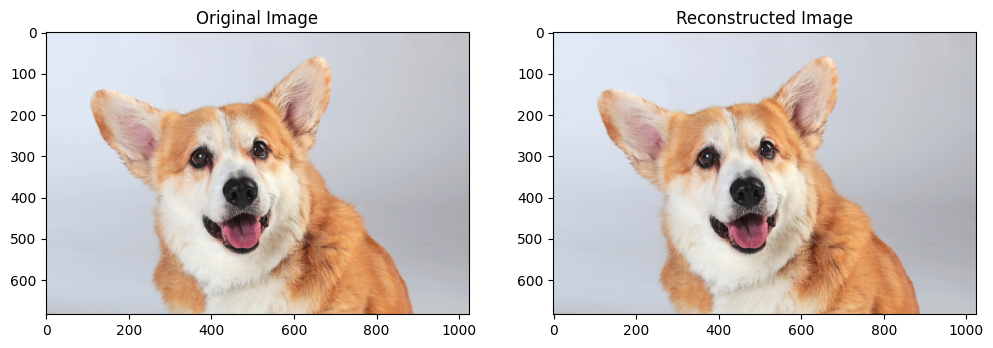

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.fftpack import dct, idct

# Load and display the original image
def load_image(path):
    image = Image.open(path).convert("RGB")
    return np.array(image)

# Step 1: Pad the image to ensure it is divisible by the block size
def pad_image(image, block_size=8):
    h, w, _ = image.shape
    pad_h = (block_size - h % block_size) % block_size
    pad_w = (block_size - w % block_size) % block_size
    padded_image = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
    return padded_image, (h, w)

# Define the stdct (2D DCT with stride and hopping) and istdct functions
def stdct(block, norm='ortho'):
    return dct(dct(block.T, norm=norm).T, norm=norm)

def istdct(dct_block, norm='ortho'):
    return idct(idct(dct_block.T, norm=norm).T, norm=norm)

# Step 2: Convert the image to DCT latent space with overlap and hopping
def image_to_dct_with_overlap(image, block_size=8, hop_size=4):
    h, w, c = image.shape
    dct_height = (h - block_size) // hop_size + 1
    dct_width = (w - block_size) // hop_size + 1
    dct_latent = np.zeros((dct_height, dct_width, c, block_size, block_size), dtype=np.float32)

    for i in range(dct_height):
        for j in range(dct_width):
            for k in range(c):  # Iterate over channels
                row_start = i * hop_size
                col_start = j * hop_size
                block = image[row_start:row_start + block_size, col_start:col_start + block_size, k]
                dct_latent[i, j, k] = stdct(block)

    return dct_latent

# Step 5: Reconstruct the image from the DCT latent space with overlap and hop
def dct_to_image_with_overlap(dct_latent, original_size, block_size=8, hop_size=4):
    h, w = original_size
    padded_h = h + (block_size - h % block_size) % block_size
    padded_w = w + (block_size - w % block_size) % block_size
    reconstructed_image = np.zeros((padded_h, padded_w, 3), dtype=np.float32)
    weight_matrix = np.zeros((padded_h, padded_w, 3), dtype=np.float32)
    dct_height, dct_width, _, _, _ = dct_latent.shape

    for i in range(dct_height):
        for j in range(dct_width):
            for k in range(3):  # Iterate over channels
                row_start = i * hop_size
                col_start = j * hop_size
                ifft_block = istdct(dct_latent[i, j, k])
                
                # Add the block to the reconstructed image and update weights
                reconstructed_image[row_start:row_start + block_size, col_start:col_start + block_size, k] += ifft_block
                weight_matrix[row_start:row_start + block_size, col_start:col_start + block_size, k] += 1

    # Normalize by the weight matrix to account for overlapping areas
    reconstructed_image = np.divide(reconstructed_image, weight_matrix, where=(weight_matrix != 0))
    return np.clip(reconstructed_image[:h, :w, :], 0, 255).astype(np.uint8)

# Main pipeline
if __name__ == "__main__":
    filename = "dog.png"
    patch_size = 64
    hop_size = 32  # Overlap

    # Load and pad image
    image = load_image(filename)
    padded_image, original_size = pad_image(image, block_size=patch_size)
    print("Original Image shape:", image.shape)

    # Convert to DCT latent space
    dct_latent = image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
    print("DCT latent shape:", dct_latent.shape)

    # Reconstruct the image from DCT latent space
    reconstructed_image = dct_to_image_with_overlap(dct_latent, original_size, block_size=patch_size, hop_size=hop_size)
    print("Reconstructed image shape:", reconstructed_image.shape)

    # Visualize results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_image)
    plt.title("Reconstructed Image")

    plt.show()


Image shape: (683, 1024, 3)
dct_latent shape: (171, 255, 3, 8, 8)


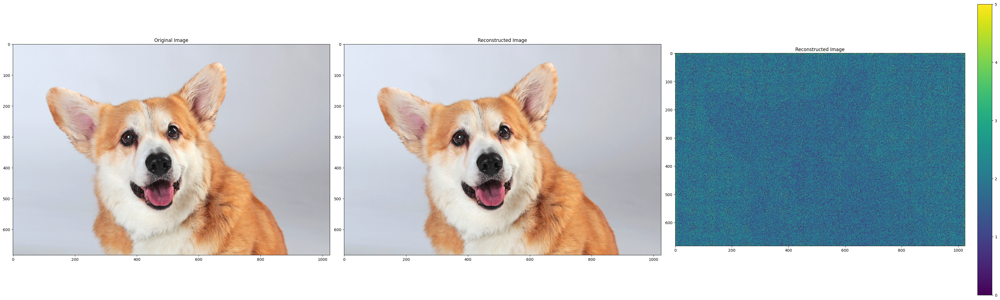

In [109]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.fftpack import dct, idct

# Pre-configured min and max values for specific patch sizes
pre_config_min_max = {
    "4x4": {
        (0, 0): [0, 1024], 
        (3, 3): [-512, 512],
    },    
    "8x8": {
        (0, 0): [0, 2048],
        (3, 3): [-1024, 1024],
        (7, 7): [-512, 512],
    },
    "16x16": {
        (0, 0): [0, 4096],
        (3, 3): [-2048, 2048],
        (7, 7): [-1024, 1024],
        (15, 15): [-512, 512],
    },
    "32x32": {
        (0, 0): [0, 8192],
        (3, 3): [-4096, 4096],
        (7, 7): [-2048, 2048],
        (15, 15): [-1024, 1024],
        (31, 31): [-512, 512],
    },
    "64x64": {
        (0, 0): [0, 16384],
        (3, 3): [-8192, 8192],
        (7, 7): [-4096, 4096],
        (15, 15): [-2048, 2048],
        (31, 31): [-1024, 1024],
        (63, 63): [-512, 512],
    },
    "128x128": {
        (0, 0)  : [0, 16384*2],        
        (3, 3)  : [-16384, 16384],
        (7, 7)  : [ -8192, 8192],
        (15, 15): [ -4096, 4096],
        (31, 31): [ -2048, 2048],
        (63, 63): [ -1024, 1024],
        (127, 127): [-512, 512],
    }
}

def load_image(path):
    image = Image.open(path).convert("RGB")
    return np.array(image)

def pad_image(image, block_size=8):
    h, w, _ = image.shape
    pad_h = (block_size - h % block_size) % block_size
    pad_w = (block_size - w % block_size) % block_size
    padded_image = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
    return padded_image, (h, w)

def stdct(block, norm='ortho'):
    return dct(dct(block.T, norm=norm).T, norm=norm)

def istdct(dct_block, norm='ortho'):
    return idct(idct(dct_block.T, norm=norm).T, norm=norm)

def image_to_dct_with_overlap(image, block_size=8, hop_size=4):
    h, w, c = image.shape
    dct_height = (h - block_size) // hop_size + 1
    dct_width = (w - block_size) // hop_size + 1
    dct_latent = np.zeros((dct_height, dct_width, c, block_size, block_size), dtype=np.float32)

    for i in range(dct_height):
        for j in range(dct_width):
            for k in range(c):
                row_start = i * hop_size
                col_start = j * hop_size
                block = image[row_start:row_start + block_size, col_start:col_start + block_size, k]
                dct_latent[i, j, k] = stdct(block)

    return dct_latent

# Quantization function for n-bits
def quantize_nbits(array, min_val, max_val, nbits=8):
    """Quantize array to n-bit fixed precision."""
    scale = (2 ** nbits) - 1
    return np.round((array - min_val) / (max_val - min_val) * scale).astype(np.int32)

# Dequantization function for n-bits
def dequantize_nbits(array, min_val, max_val, nbits=8):
    """Dequantize n-bit fixed precision array back to original floating range."""
    scale = (2 ** nbits) - 1
    return array / scale * (max_val - min_val) + min_val

def get_interpolated_min_max(size_key, i, j):
    size_config = pre_config_min_max[size_key]
    nearest_keys = sorted(size_config.keys())
    
    lower_key = max([key for key in nearest_keys if key[0] <= i and key[1] <= j], default=(0, 0))
    upper_key = min([key for key in nearest_keys if key[0] >= i and key[1] >= j], default=nearest_keys[-1])

    if lower_key == upper_key:
        min_val, max_val = size_config[lower_key]
    else:
        min_val_lower, max_val_lower = size_config[lower_key]
        min_val_upper, max_val_upper = size_config[upper_key]
        ratio = max(i / upper_key[0], j / upper_key[1]) if upper_key[0] and upper_key[1] else 1
        min_val = min_val_lower + (min_val_upper - min_val_lower) * ratio
        max_val = max_val_lower + (max_val_upper - max_val_lower) * ratio

    return min_val, max_val

def progressive_dct_normalize(dct_latent, patch_size):
    size_key = f"{patch_size}x{patch_size}"
    for i in range(patch_size):
        for j in range(patch_size):
            min_val, max_val = get_interpolated_min_max(size_key, i, j)
            component = dct_latent[..., i, j]
            dct_latent[..., i, j] = (component - min_val) / (max_val - min_val) if max_val != min_val else 0
    return dct_latent

def progressive_dct_denormalize(dct_latent, patch_size):
    size_key = f"{patch_size}x{patch_size}"
    for i in range(patch_size):
        for j in range(patch_size):
            min_val, max_val = get_interpolated_min_max(size_key, i, j)
            component = dct_latent[..., i, j]
            dct_latent[..., i, j] = component * (max_val - min_val) + min_val
    return dct_latent

import numpy as np

def truncate_digits(array, precision=2):
    """Truncate digits of an array to a specified precision using rounding."""
    return np.round(array, decimals=precision)
    

def dct_to_image_with_overlap(dct_latent, original_size, block_size=8, hop_size=4):
    h, w = original_size
    padded_h = h + (block_size - h % block_size) % block_size
    padded_w = w + (block_size - w % block_size) % block_size
    reconstructed_image = np.zeros((padded_h, padded_w, 3), dtype=np.float32)
    weight_matrix = np.zeros((padded_h, padded_w, 3), dtype=np.float32)
    dct_height, dct_width, _, _, _ = dct_latent.shape

    for i in range(dct_height):
        for j in range(dct_width):
            for k in range(3):
                row_start = i * hop_size
                col_start = j * hop_size
                ifft_block = istdct(dct_latent[i, j, k])
                reconstructed_image[row_start:row_start + block_size, col_start:col_start + block_size, k] += ifft_block
                weight_matrix[row_start:row_start + block_size, col_start:col_start + block_size, k] += 1

    reconstructed_image = np.divide(reconstructed_image, weight_matrix, where=(weight_matrix != 0))
    return np.clip(reconstructed_image[:h, :w, :], 0, 255).astype(np.uint8)

# Main pipeline
#if __name__ == "__main__":
filename = "dog.png"
patch_size = 8
hop_size = 4
truncate= 3
nbits = 9
image = load_image(filename)
padded_image, original_size = pad_image(image, block_size=patch_size)
print("Image shape:", image.shape)

dct_latent = image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
dct_latent_norm = progressive_dct_normalize(dct_latent, patch_size)
dct_latent_norm_truncate = truncate_digits(dct_latent_norm, precision=truncate)
dct_latent_norm_truncated_quant   =quantize_nbits(dct_latent_norm_truncate, min_val=-1, max_val=1,  nbits=nbits)
dct_latent_norm_truncated_dequant = dequantize_nbits(dct_latent_norm_truncated_quant, min_val=-1, max_val=1,  nbits=nbits)

dct_latent_denorm = progressive_dct_denormalize(dct_latent_norm_truncated_dequant, patch_size)
print("dct_latent shape:", dct_latent.shape)
reconstructed_image = dct_to_image_with_overlap(dct_latent_denorm, original_size, block_size=patch_size, hop_size=hop_size)

plt.figure(figsize=(36, 12))
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image")

plt.subplot(1, 3, 3)
delta_image = np.sqrt(np.sum((image - reconstructed_image) ** 2, axis=2))
# Define a fixed color range based on expected difference values
 
fixed_max = np.max(delta_image)  # or set a specific maximum if you want

img=plt.imshow(delta_image, cmap="viridis",  vmax=5)
plt.title("Reconstructed Image")
cbar = plt.colorbar(img, fraction=0.046, pad=0.04) 

plt.tight_layout()
plt.show()


In [63]:
22*32

704

In [68]:
3*64*64

12288

Image shape: (683, 1024)
dct_latent shape: (85, 127, 1, 16, 16)


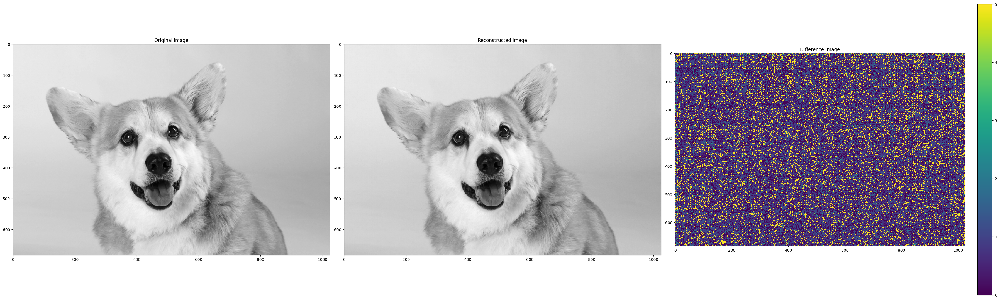

In [118]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.fftpack import dct, idct

# Pre-configured min and max values for specific patch sizes
pre_config_min_max = {
    "4x4": {
        (0, 0): [0, 1024], 
        (3, 3): [-512, 512],
    },    
    "8x8": {
        (0, 0): [0, 2048],
        (3, 3): [-1024, 1024],
        (7, 7): [-512, 512],
    },
    "16x16": {
        (0, 0): [0, 4096],
        (3, 3): [-2048, 2048],
        (7, 7): [-1024, 1024],
        (15, 15): [-512, 512],
    },
    "32x32": {
        (0, 0): [0, 8192],
        (3, 3): [-4096, 4096],
        (7, 7): [-2048, 2048],
        (15, 15): [-1024, 1024],
        (31, 31): [-512, 512],
    },
    "64x64": {
        (0, 0): [0, 16384],
        (3, 3): [-8192, 8192],
        (7, 7): [-4096, 4096],
        (15, 15): [-2048, 2048],
        (31, 31): [-1024, 1024],
        (63, 63): [-512, 512],
    },
    "128x128": {
        (0, 0): [0, 32768],        
        (3, 3): [-16384, 16384],
        (7, 7): [ -8192, 8192],
        (15, 15): [ -4096, 4096],
        (31, 31): [ -2048, 2048],
        (63, 63): [ -1024, 1024],
        (127, 127): [-512, 512],
    }
}

def load_image(path, mode='RGB'):
    image = Image.open(path).convert(mode)
    return np.array(image)

def pad_image(image, block_size=8):
    h, w = image.shape[:2]
    pad_h = (block_size - h % block_size) % block_size
    pad_w = (block_size - w % block_size) % block_size
    padded_image = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant') if image.ndim == 3 else np.pad(image, ((0, pad_h), (0, pad_w)), mode='constant')
    return padded_image, (h, w)

def stdct(block, norm='ortho'):
    return dct(dct(block.T, norm=norm).T, norm=norm)

def istdct(dct_block, norm='ortho'):
    return idct(idct(dct_block.T, norm=norm).T, norm=norm)

def image_to_dct_with_overlap(image, block_size=8, hop_size=4):
    h, w = image.shape[:2]
    c = 1 if image.ndim == 2 else image.shape[2]
    dct_height = (h - block_size) // hop_size + 1
    dct_width = (w - block_size) // hop_size + 1
    dct_latent = np.zeros((dct_height, dct_width, c, block_size, block_size), dtype=np.float32)

    for i in range(dct_height):
        for j in range(dct_width):
            for k in range(c):
                row_start = i * hop_size
                col_start = j * hop_size
                block = image[row_start:row_start + block_size, col_start:col_start + block_size] if c == 1 else image[row_start:row_start + block_size, col_start:col_start + block_size, k]
                dct_latent[i, j, k] = stdct(block)

    return dct_latent

def quantize_nbits(array, min_val, max_val, nbits=8):
    scale = (2 ** nbits) - 1
    return np.round((array - min_val) / (max_val - min_val) * scale).astype(np.int32)

def dequantize_nbits(array, min_val, max_val, nbits=8):
    scale = (2 ** nbits) - 1
    return array / scale * (max_val - min_val) + min_val

def get_interpolated_min_max(size_key, i, j):
    size_config = pre_config_min_max[size_key]
    nearest_keys = sorted(size_config.keys())
    
    lower_key = max([key for key in nearest_keys if key[0] <= i and key[1] <= j], default=(0, 0))
    upper_key = min([key for key in nearest_keys if key[0] >= i and key[1] >= j], default=nearest_keys[-1])

    if lower_key == upper_key:
        min_val, max_val = size_config[lower_key]
    else:
        min_val_lower, max_val_lower = size_config[lower_key]
        min_val_upper, max_val_upper = size_config[upper_key]
        ratio = max(i / upper_key[0], j / upper_key[1]) if upper_key[0] and upper_key[1] else 1
        min_val = min_val_lower + (min_val_upper - min_val_lower) * ratio
        max_val = max_val_lower + (max_val_upper - max_val_lower) * ratio

    return min_val, max_val

def progressive_dct_normalize(dct_latent, patch_size):
    size_key = f"{patch_size}x{patch_size}"
    for i in range(patch_size):
        for j in range(patch_size):
            min_val, max_val = get_interpolated_min_max(size_key, i, j)
            component = dct_latent[..., i, j]
            dct_latent[..., i, j] = (component - min_val) / (max_val - min_val) if max_val != min_val else 0
    return dct_latent

def progressive_dct_denormalize(dct_latent, patch_size):
    size_key = f"{patch_size}x{patch_size}"
    for i in range(patch_size):
        for j in range(patch_size):
            min_val, max_val = get_interpolated_min_max(size_key, i, j)
            component = dct_latent[..., i, j]
            dct_latent[..., i, j] = component * (max_val - min_val) + min_val
    return dct_latent

def truncate_digits(array, precision=2):
    return np.round(array, decimals=precision)

def dct_to_image_with_overlap(dct_latent, original_size, block_size=8, hop_size=4):
    h, w = original_size
    c = dct_latent.shape[2]
    padded_h = h + (block_size - h % block_size) % block_size
    padded_w = w + (block_size - w % block_size) % block_size
    reconstructed_image = np.zeros((padded_h, padded_w, c), dtype=np.float32)
    weight_matrix = np.zeros((padded_h, padded_w, c), dtype=np.float32)
    dct_height, dct_width = dct_latent.shape[:2]

    for i in range(dct_height):
        for j in range(dct_width):
            for k in range(c):
                row_start = i * hop_size
                col_start = j * hop_size
                ifft_block = istdct(dct_latent[i, j, k])
                reconstructed_image[row_start:row_start + block_size, col_start:col_start + block_size, k] += ifft_block
                weight_matrix[row_start:row_start + block_size, col_start:col_start + block_size, k] += 1

    reconstructed_image = np.divide(reconstructed_image, weight_matrix, where=(weight_matrix != 0))
    return np.clip(reconstructed_image[:h, :w], 0, 255).astype(np.uint8)

# Main pipeline
filename = "dog.png"
mode = 'L'  # Use 'L' for grayscale, 'RGB' for color, and 'RGBA' for images with alpha channel
patch_size = 16
hop_size = 8
truncate = 3
nbits = 10

image = load_image(filename, mode=mode)
padded_image, original_size = pad_image(image, block_size=patch_size)
print("Image shape:", image.shape)

dct_latent = image_to_dct_with_overlap(padded_image, block_size=patch_size, hop_size=hop_size)
dct_latent_norm = progressive_dct_normalize(dct_latent, patch_size)
dct_latent_norm_truncate = truncate_digits(dct_latent_norm, precision=truncate)
dct_latent_norm_truncated_quant = quantize_nbits(dct_latent_norm_truncate, min_val=-1, max_val=1, nbits=nbits)
dct_latent_norm_truncated_dequant = dequantize_nbits(dct_latent_norm_truncated_quant, min_val=-1, max_val=1, nbits=nbits)

dct_latent_denorm = progressive_dct_denormalize(dct_latent_norm_truncated_dequant, patch_size)
print("dct_latent shape:", dct_latent.shape)
reconstructed_image = dct_to_image_with_overlap(dct_latent_denorm, original_size, block_size=patch_size, hop_size=hop_size)

plt.figure(figsize=(36, 12))
plt.subplot(1, 3, 1)
plt.imshow(image, cmap="gray" if mode == 'L' else None)
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image, cmap="gray" if mode == 'L' else None)
plt.title("Reconstructed Image")

plt.subplot(1, 3, 3)
# Determine if the image has multiple channels
# Ensure reconstructed_image has the same shape as the original image
if reconstructed_image.shape != image.shape:
    if reconstructed_image.shape[-1] == 1:
        reconstructed_image = reconstructed_image[..., 0]  # Remove the extra channel dimension for grayscale

# Determine if the image has multiple channels
is_color = image.ndim == 3 and image.shape[2] > 1

# Calculate delta image based on whether the image is grayscale or color
delta_image = np.sqrt(np.sum((image - reconstructed_image) ** 2, axis=2)) if is_color else np.abs(image - reconstructed_image)
fixed_max = np.max(delta_image)  

# Plotting
img = plt.imshow(delta_image, cmap="viridis", vmax=5)
plt.title("Difference Image")
cbar = plt.colorbar(img, fraction=0.046, pad=0.04)


plt.tight_layout()
plt.show()
